# Financial Fraud Detection using Generative AI and Quantum ML

## Load data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data_path = '/content/drive/My Drive/financial_fraud/Final_Dataset.csv'

In [ ]:
import pandas as pd

df = pd.read_csv(data_path)
df.head()

,Fillings,Fraud
0,nanitem 14 exhibits financial statements repor...,yes
1,item 14 principal accounting fees services mat...,no
2,item 14 exhibits financial statements schedule...,yes
3,item 14 exhibits financial statement schedules...,yes
4,item 14 exhibits financial statement schedules...,no


## Exploring Vectorization methods

In [ ]:
dc = df.copy()
dc['Word_Count'] = df['Fillings'].apply(lambda x: len(x.split()))
df[dc['Word_Count'] == dc['Word_Count'].max()]['Fillings']

62    item 14 exhibits financial statement schedules...
Name: Fillings, dtype: object

In [ ]:
max_words = df['Fillings'].str.split().str.len().max()
print(f"Maximum number of words in fillings column: {max_words}")

Maximum number of words in fillings column: 707488


In [ ]:
dc['Word_Count'].nlargest(15)

62     707488
91     677150
89     670248
68     662931
60     606840
30     581956
144    574062
63     540829
119    537009
21     520592
11     479522
75     457279
80     453694
125    453677
67     424971
Name: Word_Count, dtype: int64

## Checking the data by running CNN model on tf-idf'ed data

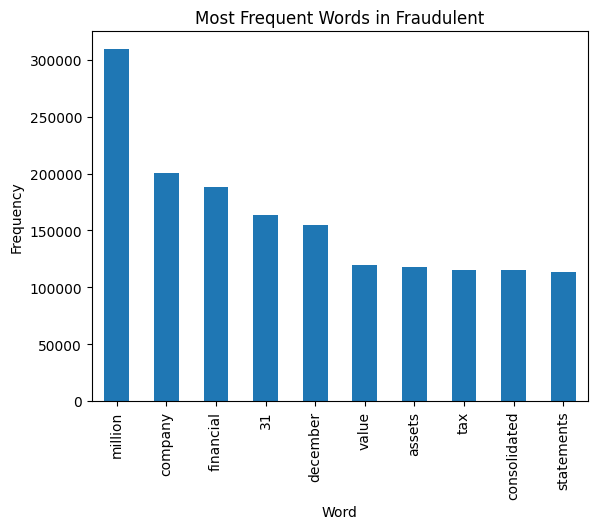

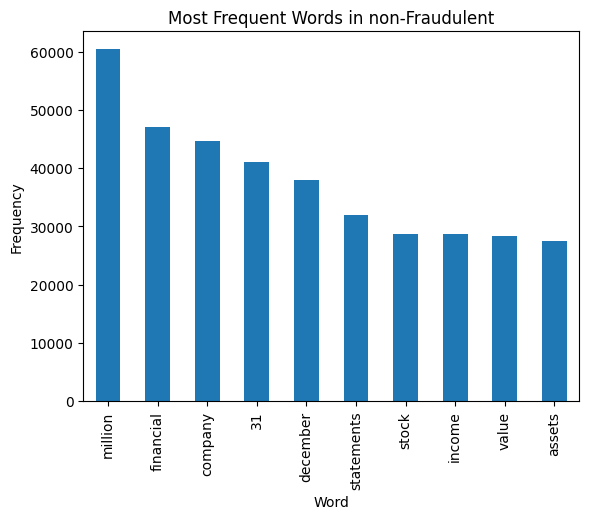

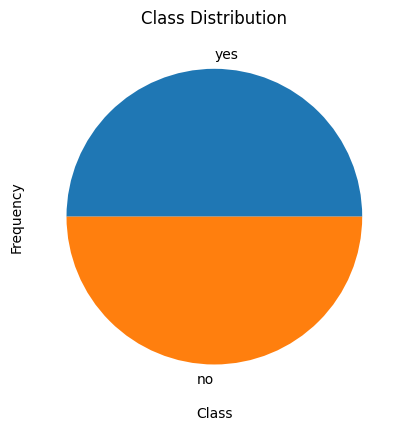

In [ ]:
# prompt: plots showing word occurrences in df['Fillings'] and other information

import matplotlib.pyplot as plt

# Plot word occurrences in df['Fillings']
fraud = df[df['Fraud']=='yes']['Fillings'].str.split().explode().value_counts().head(10).plot(kind='bar')
plt.xlabel('Word')
plt.ylabel('Frequency')
plt.title('Most Frequent Words in Fraudulent')
plt.show()

df[df['Fraud']=='no']['Fillings'].str.split().explode().value_counts().head(10).plot(kind='bar')
plt.xlabel('Word')
plt.ylabel('Frequency')
plt.title('Most Frequent Words in non-Fraudulent')
plt.show()

# Plot other information
df['Fraud'].value_counts().plot(kind='pie')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.title('Class Distribution')
plt.show()


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer as tfidf
import numpy as np
corpus = np.array(df['Fillings'])
tfidf_vectorizer = tfidf(stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(corpus).toarray()

In [ ]:
tfidf_matrix_expanded = np.expand_dims(tfidf_matrix, axis=-1)
tfidf_matrix_expanded.shape

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
label = np.array(le.fit_transform(df['Fraud']))

In [ ]:
label.shape

In [ ]:
import tensorflow as tf

model = tf.keras.models.Sequential([
  tf.keras.layers.Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(tfidf_matrix.shape[1], 1)),
  tf.keras.layers.MaxPooling1D(pool_size=2),
  tf.keras.layers.Conv1D(filters=64, kernel_size=3, activation='relu'),
  tf.keras.layers.MaxPooling1D(pool_size=2),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(units=128, activation='relu'),
  tf.keras.layers.Dense(units=1, activation='sigmoid')
])

model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

history = model.fit(tfidf_matrix_expanded[:100], label[:100], validation_data=(tfidf_matrix_expanded[100:140], label[100:140]), batch_size=15, epochs=10)

model.evaluate(tfidf_matrix_expanded[140:], label[140:])


In [ ]:

import matplotlib.pyplot as plt

_, ax = plt.subplots(1, 2, figsize=(8, 4))

ax[0].plot(history.history['accuracy'], label='Training Accuracy')
ax[0].plot(history.history['val_accuracy'], label='Validation Accuracy')
ax[0].title.set_text('Training and Validation Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

ax[1].plot(history.history['loss'], label='Training Loss')
ax[1].plot(history.history['val_loss'], label='Validation Loss')
ax[1].title.set_text('Training and Validation Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].legend()
plt.show()


Hence tf-idf text encoding is a promising approach: Good enough

# ☹ <span style="color: red;">**Quantum Generative Adversarial Network**</span>

The main purpose of using a QGAN here is, for the advantage of data loading.

The QGAN consists of a quantum generator and a classical discriminator.

(We treat the discriminator as a classifier.)

Given k-dimensional data samples, we use the qGAN to learn a random distribution and load it to a quantum state

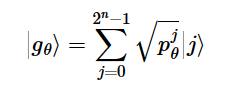

Here, $p^j_θ$ describes the occurrence probabilities of the basis states $|j⟩$.

The aim of the qGAN training is to generate a state $|g_θ⟩$ where $p^j_θ$ for $j ∈ $ {$0,..., 2^n - 1$}

## Method

### Quantum Generator
*   We use tf-idf vectorizer to convert text to feature vector.
*   Then we reduce number of features using t-SNE (to about 16)
*   Following reduction in features, we normalise to [0. 1] range
*   And then we encode it using Angle (or Phase) Encoding
*   Then define QuantumCircuit
*   Train Generator

### Classical Discriminator
*   We use a classical discriminator to distinguish between fraudulent and non-fraudulent financial statements.





In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer as tfidf
from sklearn.manifold import TSNE
import numpy as np
import torch

In [ ]:
corpus = np.array(df['Fillings'])
tfidf_vectorizer = tfidf(stop_words='english')
tfidf_matrix = tfidf_vectorizer.fit_transform(corpus).toarray()
print(tfidf_matrix.shape)

(170, 112558)


In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
labels = np.array(le.fit_transform(df['Fraud']))

In [ ]:
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder()
labels_categorical = ohe.fit_transform(labels.reshape(-1, 1)).toarray()

In [ ]:
n_components = 64
tsne = TSNE(n_components=n_components, method='exact', random_state=42)
tsne_data = tsne.fit_transform(tfidf_matrix)
print(tsne_data.shape)
t_tsne_data = tsne_data.copy()

# Normalisation
# normalized_data = (tsne_data - np.min(tsne_data, axis=0)) / (np.max(tsne_data, axis=0) - np.min(tsne_data, axis=0))

# Mapping values to angles in the range [0, 2*pi]
# angles = 2 * np.pi * normalized_data
#  OR
# angles = 2 * np.arcsin(np.sqrt(normalized_data))

# Define number of qubits for generator
# num_qubits_total = 6

# Define Noise prior
# randoms = np.random.normal(-np.pi*.01, np.pi*.01, 2**num_qubits_total)

(170, 64)


### Tokenizing

In [ ]:
import torch
from transformers import BertTokenizer
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split


texts = df['Fillings'].tolist()

# Tokenize the text data
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
max_length = 512

def split_text(text, max_length):
    words = text.split()
    for i in range(0, len(words), max_length):
        yield ' '.join(words[i:i + max_length])

def tokenize_texts(texts, max_length=512):
    input_ids_list = []
    attention_mask_list = []

    for text in texts:
        chunks = list(split_text(text, max_length - 2))  # Subtract 2 to account for special tokens [CLS] and [SEP]
        for chunk in chunks:
            tokens = tokenizer(
                chunk,
                max_length=max_length,
                truncation=True,
                padding='max_length',
                return_tensors='pt'
            )
            input_ids_list.append(tokens['input_ids'])
            attention_mask_list.append(tokens['attention_mask'])

    input_ids = torch.cat(input_ids_list, dim=0)
    attention_mask = torch.cat(attention_mask_list, dim=0)
    return input_ids, attention_mask


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

In [ ]:
input_ids, attention_mask = tokenize_texts(texts, max_length)

print(input_ids.shape, attention_mask.shape)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

torch.Size([53539, 512]) torch.Size([53539, 512])


### Save tokenized data so it does not need to be made again

In [ ]:
# saving data
np.save('/content/drive/MyDrive/financial_fraud/input_ids.npy', input_ids.numpy())
np.save('/content/drive/MyDrive/financial_fraud/attention_mask.npy', attention_mask.numpy())

In [ ]:
import numpy as np

# loading data
input_ids = np.load('/content/drive/MyDrive/financial_fraud/input_ids.npy')
attention_mask = np.load('/content/drive/MyDrive/financial_fraud/attention_mask.npy')

In [ ]:
print(input_ids.shape, attention_mask.shape)

(53539, 512) (53539, 512)


### DataLoader

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader

class TextDataset(Dataset):
    def __init__(self, input_ids, attention_mask):
        self.input_ids = input_ids
        self.attention_mask = attention_mask

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attention_mask[idx]


batch_size = 256
dataset = TextDataset(input_ids, attention_mask)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)


In [ ]:
import torch.nn as nn

class LSTMAutoencoderOld(nn.Module):
    def __init__(self, input_dim, hidden_dim, encoded_dim, vocab_size):
        super(LSTMAutoencoder, self).__init__()
        self.encoder = nn.LSTM(input_dim, hidden_dim, batch_first=True)
        self.encoder_fc = nn.Linear(hidden_dim, encoded_dim)
        self.decoder_fc = nn.Linear(encoded_dim, hidden_dim)
        self.decoder = nn.LSTM(hidden_dim, input_dim, batch_first=True)
        self.output_layer = nn.Linear(input_dim, vocab_size)
        self.vocab_size = vocab_size

    def forward(self, input_ids):
        print("LSTM-AE Input shape: ", input_ids.shape)
        # Encode
        embedded = nn.functional.one_hot(input_ids, num_classes=self.vocab_size).float()
        print("LSTM-AE Embedded shape: ", embedded.shape)
        encoded, (hidden, cell) = self.encoder(embedded)
        print("LSTM-AE Encoded shape: ", encoded.shape)
        print("LSTM-AE Hidden shape: ", hidden.shape)
        print("LSTM-AE Cell shape: ", cell.shape)
        encoded = self.encoder_fc(hidden[-1])
        print("LSTM-AE encoder-fc output shape: ", encoded.shape)

        # Decode
        decoded_hidden = self.decoder_fc(encoded).unsqueeze(0)
        print("LSTM-AE decoded_hidden shape: ", decoded_hidden.shape)
        decoded, _ = self.decoder(embedded, (decoded_hidden, cell))
        print("LSTM-AE decoded shape: ", decoded.shape)
        reconstructed = self.output_layer(decoded)
        print("LSTM-AE reconstructed shape: ", reconstructed.shape)
        return reconstructed, encoded

In [ ]:
import torch
import torch.nn as nn

class LSTMAutoencoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, encoded_dim, vocab_size):
        super(LSTMAutoencoder, self).__init__()
        self.encoder = nn.LSTM(vocab_size, hidden_dim, batch_first=True)
        self.encoder_fc = nn.Linear(hidden_dim, encoded_dim)
        self.decoder_fc = nn.Linear(encoded_dim, hidden_dim)
        self.decoder = nn.LSTM(hidden_dim, hidden_dim, batch_first=True)
        self.output_layer = nn.Linear(hidden_dim, vocab_size)
        self.vocab_size = vocab_size

    def forward(self, input_ids):
        # print("LSTM-AE Input shape: ", input_ids.shape)
        # Encode
        embedded = nn.functional.one_hot(input_ids, num_classes=self.vocab_size).float()
        # print("LSTM-AE Embedded shape: ", embedded.shape)
        encoded, (hidden, cell) = self.encoder(embedded)
        # print("LSTM-AE Encoded shape: ", encoded.shape)
        # print("LSTM-AE Hidden shape: ", hidden.shape)
        # print("LSTM-AE Cell shape: ", cell.shape)
        encoded = self.encoder_fc(hidden[-1])
        # print("LSTM-AE encoder-fc output shape: ", encoded.shape)

        # Decode
        decoded_hidden = self.decoder_fc(encoded).unsqueeze(0).repeat(self.encoder.num_layers, 1, 1)
        # print("LSTM-AE decoded_hidden shape: ", decoded_hidden.shape)
        cell = cell[:self.encoder.num_layers]
        # print("LSTM-AE adjusted cell shape: ", cell.shape)

        decoded_input = hidden[-1].unsqueeze(1).repeat(1, input_ids.size(1), 1)  # Prepare input for decoder
        # print("LSTM-AE decoded_input shape: ", decoded_input.shape)

        decoded, _ = self.decoder(decoded_input, (decoded_hidden, cell))
        # print("LSTM-AE decoded shape: ", decoded.shape)
        reconstructed = self.output_layer(decoded)
        # print("LSTM-AE reconstructed shape: ", reconstructed.shape)
        return reconstructed, encoded

# LSTM-AE Input shape:  torch.Size([16, 512])
# LSTM-AE Embedded shape:  torch.Size([16, 512, 30522])
# LSTM-AE Encoded shape:  torch.Size([16, 512, 256])
# LSTM-AE Hidden shape:  torch.Size([1, 16, 256])
# LSTM-AE Cell shape:  torch.Size([1, 16, 256])
# LSTM-AE encoder-fc output shape:  torch.Size([16, 64])
# LSTM-AE decoded_hidden shape:  torch.Size([1, 16, 256])
# LSTM-AE adjusted cell shape:  torch.Size([1, 16, 256])
# LSTM-AE decoded_input shape:  torch.Size([16, 512, 256])
# LSTM-AE decoded shape:  torch.Size([16, 512, 256])
# LSTM-AE reconstructed shape:  torch.Size([16, 512, 30522])

In [ ]:
import torch.optim as optim


device = 'cpu' #torch.device('cuda' if torch.cuda.is_available() else 'cpu')
input_dim = tokenizer.vocab_size
hidden_dim = 256
encoded_dim = 64
model = LSTMAutoencoder(input_dim, hidden_dim, encoded_dim, input_dim).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
n_epochs = 5

for epoch in range(n_epochs):
    model.train()
    total_loss = 0
    for input_ids_batch, attention_mask_batch in dataloader:
        input_ids_batch = input_ids_batch.to(device)

        optimizer.zero_grad()
        outputs, _ = model(input_ids_batch)

        loss = criterion(outputs.view(-1, input_dim), input_ids_batch.view(-1))
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(dataloader)
    print(f'Epoch {epoch+1}/{n_epochs}, Loss: {avg_loss}')


In [ ]:
# save model
torch.save(model.state_dict(), '/content/drive/MyDrive/financial_fraud/LSTMAutoencoder.pth')

In [ ]:
# load model
model = LSTMAutoencoder(input_dim, hidden_dim, encoded_dim, input_dim)
model.load_state_dict(torch.load('/content/drive/MyDrive/financial_fraud/LSTMAutoencoder.pth'))
model.eval()

In [ ]:
# Dimensionality reduction using encoder
def reduce_dimensions(text):
    input_ids, attention_mask = tokenize_texts([text], max_length)
    input_ids = input_ids.to(device)
    with torch.no_grad():
        _, encoded = model(input_ids)
    return encoded.cpu().numpy()

# Example usage
text_example = texts[0]
print(text_example)
reduced_data = reduce_dimensions(text_example)
print("Encoded Representation Shape:", reduced_data.shape)

In [ ]:
# Reconstruction using decoder
def reconstruct_text(encoded_representation):
    encoded_tensor = torch.tensor(encoded_representation, dtype=torch.float32).to(device)
    encoded_tensor = encoded_tensor.unsqueeze(0)
    with torch.no_grad():
        decoded_hidden = model.decoder_fc(encoded_tensor).unsqueeze(0)
        empty_input = torch.zeros((1, max_length, tokenizer.vocab_size)).to(device)
        decoded, _ = model.decoder(empty_input, (decoded_hidden, decoded_hidden))
        reconstructed_ids = model.output_layer(decoded).argmax(dim=-1)
    return tokenizer.decode(reconstructed_ids[0], skip_special_tokens=True)


print("Decoded Representation:", reconstruct_text(reduced_data))

## PCA for comparison

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca_matrix = pca.fit_transform(tfidf_matrix)

normalized_matrix = (pca_matrix - np.min(pca_matrix, axis=0)) / (np.max(pca_matrix, axis=0) - np.min(pca_matrix, axis=0))



## Using TSNE to visualise features

In [ ]:
n_components = 3
# tsne = TSNE(n_components=n_components, random_state=42)
# tsne_data = tsne.fit_transform(tfidf_matrix)

from sklearn.decomposition import PCA
pca = PCA(n_components=n_components)
pca_data = pca.fit_transform(tfidf_matrix)

normalized_data = (pca_data - np.min(pca_data, axis=0)) / (np.max(pca_data, axis=0) - np.min(pca_data, axis=0))
print(f"Shape of PCA data with {n_components} components: {pca_matrix.shape}")

from plotly.offline import iplot
from plotly import graph_objs as go

trace1 = go.Scatter3d(
    x = normalized_data[:, 0],
    y = normalized_data[:, 1],
    z = normalized_data[:, 2],
    mode = 'markers',
    marker = dict(
        size = 3,
        color = 'rgb(0, 255, 255)',
        opacity = 0.8
    )
)

data = [trace1]
layout = go.Layout(
    title = '3D scatter plot of PCA data',
    scene = dict(
        xaxis = dict(title = 'X'),
        yaxis = dict(title = 'Y'),
        zaxis = dict(title = 'Z')
    ), margin=dict(l=40, r=40, t=40, b=40)
)

iplot(dict(data=data, layout=layout))


Shape of PCA data with 3 components: (170, 10)


## MLP Classifier Test

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
label = np.array(le.fit_transform(df['Fraud']))

In [ ]:
from sklearn.neural_network import MLPClassifier

clf = MLPClassifier(hidden_layer_sizes=(1024,), solver='lbfgs', max_iter=1000, alpha=0.0001,
                     learning_rate='adaptive', random_state=1)

clf.fit(tsne_data[:150], label[:150])

predictions = clf.predict(tsne_data[150:])

from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(label[150:], predictions))

print(confusion_matrix(label[150:], predictions))


              precision    recall  f1-score   support

           0       0.90      0.75      0.82        12
           1       0.70      0.88      0.78         8

    accuracy                           0.80        20
   macro avg       0.80      0.81      0.80        20
weighted avg       0.82      0.80      0.80        20

[[9 3]
 [1 7]]


In [ ]:
clf.hidden_layer_sizes

1024

## Generator

In [ ]:
%%capture
!pip install pennylane

In [ ]:
import math
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pennylane as qml

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

# Set the random seed for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

### Dataset Loader

In [ ]:
class DatasetLoader(Dataset):
    def __init__(self, labels, label=0, transform=None):
        """
        Args:
            labels (pandas.DataFrame): DataFrame containing the labels and values.
            label (int): Label to filter by.
            transform (callable, optional): Optional transform to be applied
                on a sample
        """
        self.labels = labels
        self.transform = transform
        self.df = self.filter_by_label(label)

    def filter_by_label(self, label):
        df = self.labels[self.labels['Fraud'] == label]
        return df

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        array = self.df.iloc[idx, 0]# / 16
        array = np.array(array)
        image = array.astype(np.float32).reshape(8, 8)
        #print(image.shape)

        cat_label = np.array(self.df.iloc[idx, 2])
        cat_label = torch.tensor(cat_label, dtype=torch.float).view(-1)

        if self.transform:
            image = self.transform(image)
            #print(image.shape)

        # Return image, label and categorical label
        return image, self.df.iloc[idx, 1], cat_label

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split

image_size = 8  # Height / width of the square images
batch_size = 1

transform = transforms.Compose([transforms.ToTensor()])
data = pd.DataFrame({'Filings': tsne_data.tolist(), 'Fraud': labels, 'Categorical': labels_categorical.tolist()})
x_train, x_test, y_train, y_test = train_test_split(data['Filings'], data[['Fraud', 'Categorical']], test_size=0.2, random_state=42)

train_dataset = DatasetLoader(labels=pd.concat([x_train, y_train], axis=1), transform=transform)
test_dataset = DatasetLoader(labels=pd.concat([x_test, y_test], axis=1), transform=transform)

train_loader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, drop_last=True
)
test_loader = torch.utils.data.DataLoader(
    test_dataset, batch_size=batch_size, shuffle=True, drop_last=True
)

In [ ]:
train_dataset.__getitem__(0)

(tensor([[[ 2.1605e-01, -4.1149e-01, -3.1597e-01,  2.6648e-01, -3.2949e+00,
            6.0286e-02,  2.2661e-01,  2.9204e-02],
          [ 7.1805e+00,  2.9251e-02, -2.9100e+00,  1.4206e+00, -2.0598e-01,
            1.3277e+00, -3.0754e-01, -5.6679e-01],
          [-2.2804e-01, -1.5185e-02, -1.0202e+00, -2.0571e-02, -1.1970e-01,
            4.5797e-02,  8.7471e-01,  3.3303e-01],
          [ 2.7309e+00,  4.5751e-02,  3.3130e-02,  1.0218e-01,  1.1162e-02,
           -6.1409e-04,  3.4718e-03, -2.5964e-01],
          [-1.7225e-02,  2.8289e-02, -2.1133e-01, -2.1944e-01,  1.0811e+00,
           -2.0763e+00, -4.7163e-01,  5.5420e-02],
          [-2.5674e+00, -1.1123e-02,  1.2509e+00,  7.4435e-02,  2.2128e+00,
            2.5236e+00, -2.7885e-02, -1.6605e+00],
          [ 4.6466e-02,  4.1373e-03, -3.3878e+00, -5.2203e-01,  9.8067e-02,
           -1.3597e-01, -8.8614e-02, -4.4460e-02],
          [ 1.0975e-01,  1.8173e-03, -2.5979e-01, -9.7499e-02,  2.2506e-01,
           -8.5978e-01,  2.5946e+00

In [ ]:
_, _, c = dataset.__getitem__(0)

torch.Size([2])

# Quantum SGANs

## Generator


The generator used is a Patch Quantum Generator. This method is helpful when there is a limitation of number of qubits available. This method also enables us to parallelise the execution.

In [ ]:
n_qubits = 5  # Total number of qubits / N
n_a_qubits = 1  # Number of ancillary qubits / N_A
q_depth = 6  # Depth of the parameterised quantum circuit / D
n_generators = 4  # Number of subgenerators for the patch method / N_G

In [ ]:
dev = qml.device("lightning.qubit", wires=n_qubits)
# Enable CUDA device if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
@qml.qnode(dev, diff_method="parameter-shift")
def quantum_circuit(noise, weights):

    weights = weights.reshape(q_depth, n_qubits)

    # Initialise latent vectors
    for i in range(n_qubits):
        qml.RY(noise[i], wires=i)

    # Repeated layer
    for i in range(q_depth):
        # Parameterised layer
        for y in range(n_qubits):
            qml.RY(weights[i][y], wires=y)

        # Control Z gates
        for y in range(n_qubits - 1):
            qml.CZ(wires=[y, y + 1])

    return qml.probs(wires=list(range(n_qubits)))


# For further info on how the non-linear transform is implemented in Pennylane
# https://discuss.pennylane.ai/t/ancillary-subsystem-measurement-then-trace-out/1532
def partial_measure(noise, weights):
    # Non-linear Transform
    probs = quantum_circuit(noise, weights)
    probsgiven0 = probs[: (2 ** (n_qubits - n_a_qubits))]
    probsgiven0 /= torch.sum(probs)

    # Post-Processing
    probsgiven = probsgiven0 / torch.max(probsgiven0)
    return probsgiven

In [ ]:
class PatchQuantumGenerator(nn.Module):
    """Quantum generator class for the patch method"""

    def __init__(self, n_generators, q_delta=1):
        """
        Args:
            n_generators (int): Number of sub-generators to be used in the patch method.
            q_delta (float, optional): Spread of the random distribution for parameter initialisation.
        """

        super().__init__()

        self.q_params = nn.ParameterList(
            [
                nn.Parameter(q_delta * torch.rand(q_depth * n_qubits), requires_grad=True)
                for _ in range(n_generators)
            ]
        )
        self.n_generators = n_generators

    def forward(self, x):
        # Size of each sub-generator output
        patch_size = 2 ** (n_qubits - n_a_qubits)

        # Create a Tensor to 'catch' a batch of images from the for loop. x.size(0) is the batch size.
        images = torch.Tensor(x.size(0), 0).to(device)

        # Iterate over all sub-generators
        for params in self.q_params:

            # Create a Tensor to 'catch' a batch of the patches from a single sub-generator
            patches = torch.Tensor(0, patch_size).to(device)
            for elem in x:
                q_out = partial_measure(elem, params).float().unsqueeze(0)
                patches = torch.cat((patches, q_out))

            # Each batch of patches is concatenated with each other to create a batch of images
            images = torch.cat((images, patches), 1)

        return images

## Discriminator

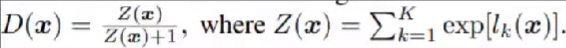

#### **Some Theory for Classical SGANs:**
This is a semi-supervised GAN Discriminator. In regular GAN, the discriminator is trained in an unsupervised manner to classify images as either real or fake.

In SGANs, discriminator gets trained in supervised manner in addition to unsupervised. This is done by stacking the two modes of Discriminator - supervised and unsupervised.

Here, we focus on the performance of Discriminator since our task is to classify the data and not only generating the data. Although, the generator can be used to generate new samples.

The SGAN has been shown to perform better than CNNs for lesser data, main takeaway from this is that not a lot of training samples are required to get a good performance.


---


**Custom Loss function:** We use Normalized sum of exponential outcome from the output of supervised model just before softmax operation.

This helps us prevent using two different models for the discriminator by reusing output layers of one model as input to the other.

#### Tensorflow implementation

In [ ]:
# def discriminator(input_shape=(8, 8, 1), n_classes=2):
#     input_image = Input(input_shape)
#     x = Conv2D(32, (3, 3), strides=(2, 2), padding='same')(input_image)
#     x = LeakyReLU(alpha=0.2)(x)

#     x = Conv2D(64, (3, 3), strides=(2, 2), padding='same')(x)
#     x = LeakyReLU(alpha=0.2)(x)

#     x = Conv2D(128, (3, 3), strides=(2, 2), padding='same')(x)
#     x = LeakyReLU(alpha=0.2)(x)

#     x = Flatten()(x)
#     x = Dropout(0.2)(x)
#     x = Dense(n_classes)(x)

#     return Model(inputs=input_image, outputs=x)


# def disc_supervised(disc):
#     model = Sequential()
#     model.add(disc)
#     model.add(Activation('softmax'))
#     model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
#     return model



# def custom_activation():
#     Z_x = K.sum(K.exp(x), axis=-1, keepdims=True)
#     D_x = Z_x / (Z_x + 1)
#     return D_x

# def disc_unsupervised(disc):
#     model = Sequential()
#     model.add(disc)
#     model.add(Lambda(custom_activation))
#     model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
#     return model

#### Trying out a partially quantum discriminator

If training the supervised discriminator is our primary focus, using a classical discriminator, we do not really get any benefit from using a qGAN, this acts as a regular classifier and hence unneccessary.

To fix that, I am shifting the goal of the model to be generation/reconstruction of data i.e. training of the generator and provision of labels.

The applications for this are wider as well, as it can now be used for data augmentation tasks when text data availablility is low. (Which it is in my case with 170 samples only)

In [ ]:
# @qml.qnode(dev)
# def discriminator_circuit(inputs, weights):
#     weights = weights.reshape(q_depth, n_qubits)
#     # Encode classical data into quantum state
#     for i in range(n_qubits):
#         qml.RY(inputs[i], wires=i)

#     # Apply variational layer
#     for i in range(q_depth):
#         for y in range(n_qubits):
#             qml.RY(weights[i], wires=y)

#     # Measurement
#     return [qml.expval(qml.PauliZ(i)) for i in range(n_qubits)]

# # Define the quantum classifier
# class QuantumDiscriminator(nn.Module):
#     def __init__(self, n_qubits, n_categories):
#         super(QuantumDiscriminator, self).__init__()
#         self.n_qubits = n_qubits
#         self.n_categories = n_categories
#         self.weights = nn.Parameter(0.01 * torch.randn(n_qubits))

#     def forward(self, x):
#         x = torch.tensor(x, dtype=torch.float32)
#         x = discriminator_circuit(x, self.weights).detach().numpy()
#         x = torch.tensor(x, dtype=torch.float32)
#         return torch.softmax(x, dim=0)



### Discriminators

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


class Discriminator(nn.Module):
    def __init__(self, input_shape=(1, 8, 8), n_classes=2):
        super(Discriminator, self).__init__()

        self.conv1 = nn.Conv2d(input_shape[0], 32, kernel_size=3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1)

        self.leaky_relu = nn.LeakyReLU(0.2)
        self.dropout = nn.Dropout(0.2)
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(128 * (input_shape[1] // 8) * (input_shape[2] // 8), n_classes)

    def forward(self, x):
        x = self.leaky_relu(self.conv1(x))
        x = self.leaky_relu(self.conv2(x))
        x = self.leaky_relu(self.conv3(x))
        x = self.flatten(x)
        x = self.dropout(x)
        x = self.fc(x)
        return x

class DiscriminatorSupervised(nn.Module):
    def __init__(self, discriminator):
        super(DiscriminatorSupervised, self).__init__()
        self.discriminator = discriminator
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.discriminator(x)
        x = self.softmax(x)
        return x


class CustomActivation(nn.Module):
    def __init__(self):
        super(CustomActivation, self).__init__()

    def forward(self, x):
        Z_x = torch.sum(torch.exp(x), dim=-1, keepdim=True)
        D_x = Z_x / (Z_x + 1)
        return D_x


class DiscriminatorUnsupervised(nn.Module):
    def __init__(self, discriminator):
        super(DiscriminatorUnsupervised, self).__init__()
        self.discriminator = discriminator
        self.custom_activation = CustomActivation()

    def forward(self, x):
        x = self.discriminator(x)
        x = self.custom_activation(x)
        return x


## Training

In [ ]:
fake_data.detach().shape

torch.Size([1, 8, 8])

In [ ]:
outD_real.shape

torch.Size([2])

In [ ]:
generator(torch.rand(1, 5, device=device) * math.pi / 2).reshape(1, 8, 8).detach().shape

torch.Size([1, 8, 8])

In [ ]:
discriminator_base = Discriminator()
discriminator_unsup = DiscriminatorUnsupervised(discriminator_base).to(device)
discriminator_sup = DiscriminatorSupervised(discriminator_base).to(device)
generator = PatchQuantumGenerator(n_generators).to(device)

In [ ]:
generator(torch.rand(1, 5, device=device) * math.pi / 2).reshape(1, 1, 8, 8)

tensor([[[[5.1261e-01, 7.8901e-01, 1.7786e-01, 2.5432e-01, 1.4624e-01,
           1.0551e-01, 7.9872e-02, 7.0483e-03],
          [8.7492e-01, 1.0000e+00, 2.6278e-01, 1.8518e-01, 1.1102e-01,
           6.6548e-03, 3.0433e-02, 1.2581e-01],
          [8.6924e-01, 6.2197e-01, 1.5198e-01, 1.7379e-01, 3.8985e-01,
           2.6537e-03, 9.8835e-02, 6.4598e-01],
          [8.5781e-01, 1.8828e-01, 1.2866e-02, 1.0000e+00, 1.1181e-02,
           5.0245e-01, 4.8222e-01, 5.4569e-01],
          [1.0000e+00, 4.4305e-01, 5.5634e-01, 7.8188e-02, 2.5411e-01,
           1.3297e-01, 1.2725e-01, 8.9677e-03],
          [1.5429e-01, 9.5626e-02, 1.9151e-04, 1.0107e-03, 5.2216e-04,
           1.4584e-03, 3.2481e-01, 8.1365e-02],
          [1.0000e+00, 1.9593e-01, 5.3885e-04, 1.0548e-01, 4.1758e-01,
           7.3009e-02, 2.2762e-04, 2.2177e-01],
          [2.4958e-01, 1.1210e-01, 2.4826e-02, 2.2577e-01, 3.7825e-03,
           1.3252e-03, 5.1674e-02, 1.9308e-01]]]], grad_fn=<ViewBackward0>)

In [ ]:
from torchsummary import summary
discriminator = Discriminator().to(device)
disc_sup = DiscriminatorSupervised(discriminator)
disc_unsup = DiscriminatorUnsupervised(discriminator)

print(summary(discriminator, (1, 8, 8)))
print(summary(disc_sup, (1, 8, 8)))
print(summary(disc_unsup, (1, 8, 8)))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1             [-1, 32, 4, 4]             320
         LeakyReLU-2             [-1, 32, 4, 4]               0
            Conv2d-3             [-1, 64, 2, 2]          18,496
         LeakyReLU-4             [-1, 64, 2, 2]               0
            Conv2d-5            [-1, 128, 1, 1]          73,856
         LeakyReLU-6            [-1, 128, 1, 1]               0
           Flatten-7                  [-1, 128]               0
           Dropout-8                  [-1, 128]               0
            Linear-9                    [-1, 2]             258
Total params: 92,930
Trainable params: 92,930
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.02
Params size (MB): 0.35
Estimated Total Size (MB): 0.37
---------------------------------------------

In [ ]:
lrG = 0.3  # Learning rate for the generator
lrD = 0.01  # Learning rate for the discriminator
num_iter = 500  # Number of training iterations

In [ ]:
discriminator_base = Discriminator()
discriminator_unsup = DiscriminatorUnsupervised(discriminator_base).to(device)
discriminator_sup = DiscriminatorSupervised(discriminator_base).to(device)
generator = PatchQuantumGenerator(n_generators).to(device)

# Binary cross entropy
criterion = nn.BCELoss()

# Categorical cross entropy
cat_criterion = nn.CrossEntropyLoss()

# Optimisers
optD1 = optim.SGD(discriminator_unsup.parameters(), lr=lrD)
optD2 = optim.SGD(discriminator_sup.parameters(), lr=lrD)
optG = optim.SGD(generator.parameters(), lr=lrG)

real_labels = torch.full((batch_size,), 1.0, dtype=torch.float, device=device)
fake_labels = torch.full((batch_size,), 0.0, dtype=torch.float, device=device)

# Fixed noise allows us to visually track the generated images throughout training
fixed_noise = torch.rand(8, n_qubits, device=device) * math.pi / 2

# Iteration counter
counter = 0

# Loss values
sup_disc_loss_values = []
unsup_disc_loss_values = []
generator_loss_values = []
train_accuracies = []

results = []

while True:
    for i, (data, label, cat_label) in enumerate(train_loader):
        cat_label = cat_label.to(device)

        # Data for training the discriminator
        #data = data.reshape(-1, image_size * image_size)
        real_data = data.to(device)

        # Noise follwing a uniform distribution in range [0,pi/2)
        noise = torch.rand(batch_size, n_qubits, device=device) * math.pi / 2
        fake_data = generator(noise).reshape(batch_size, 1, 8, 8)

        # Training the supervised discriminator
        discriminator_sup.zero_grad()
        outD_sup = discriminator_sup(real_data).view(-1)
        # accuracy
        acc = (outD_sup.argmax(dim=0).item() == label).sum()
        train_accuracies.append(acc)
        errD_sup = cat_criterion(outD_sup, cat_label.view(2))
        # Propagate gradients
        errD_sup.backward()

        optD2.step()

        # Training the unsupervised discriminator
        discriminator_unsup.zero_grad()
        outD_real = discriminator_unsup(real_data).view(-1)
        outD_fake = discriminator_unsup(fake_data.detach()).view(-1)

        errD_real = criterion(outD_real, real_labels)
        errD_fake = criterion(outD_fake, fake_labels)
        # Propagate gradients
        errD_real.backward()
        errD_fake.backward()

        errD = errD_real + errD_fake
        optD1.step()

        # Training the generator
        generator.zero_grad()
        outD_fake = discriminator_unsup(fake_data).view(-1)
        errG = criterion(outD_fake, fake_labels)
        errG.backward()
        optG.step()

        counter += 1

        sup_disc_loss_values.append(errD_sup.cpu())
        unsup_disc_loss_values.append(errD.cpu())
        generator_loss_values.append(errG.cpu())

        # Show loss values
        if counter % 10 == 0:
            print(f'Iteration: {counter}, Supervised Discriminator Loss: {errD_sup:0.3f}, Accuracy: {int(acc)}, Unsupervised Discriminator Loss: {errD:0.3f}, Generator Loss: {errG:0.3f}')

            test_embeddings = generator(fixed_noise).view(1,image_size,image_size).cpu().detach()
            if counter % 50 == 0:
                results.append(test_embeddings)

        if counter == num_iter:
            break
    if counter == num_iter:
        break

Iteration: 10, Supervised Discriminator Loss: 0.699, Accuracy: 0, Unsupervised Discriminator Loss: 1.498, Generator Loss: 1.080
Iteration: 20, Supervised Discriminator Loss: 0.687, Accuracy: 1, Unsupervised Discriminator Loss: 1.496, Generator Loss: 1.056
Iteration: 30, Supervised Discriminator Loss: 0.671, Accuracy: 1, Unsupervised Discriminator Loss: 1.482, Generator Loss: 1.043
Iteration: 40, Supervised Discriminator Loss: 0.647, Accuracy: 1, Unsupervised Discriminator Loss: 1.454, Generator Loss: 1.031
Iteration: 50, Supervised Discriminator Loss: 0.627, Accuracy: 1, Unsupervised Discriminator Loss: 1.442, Generator Loss: 1.001
Iteration: 60, Supervised Discriminator Loss: 0.581, Accuracy: 1, Unsupervised Discriminator Loss: 1.426, Generator Loss: 0.990
Iteration: 70, Supervised Discriminator Loss: 0.598, Accuracy: 1, Unsupervised Discriminator Loss: 1.423, Generator Loss: 1.005
Iteration: 80, Supervised Discriminator Loss: 0.560, Accuracy: 1, Unsupervised Discriminator Loss: 1.406

In [ ]:
generator()

In [ ]:
# Save model
torch.save(generator.state_dict(), '/content/drive/My Drive/financial_fraud/generator.pth')
torch.save(discriminator_sup.state_dict(), '/content/drive/My Drive/financial_fraud/discriminator_sup.pth')
torch.save(discriminator_unsup.state_dict(), '/content/drive/My Drive/financial_fraud/discriminator_unsup.pth')

In [ ]:
sup_disc_loss_values = [i.cpu().detach().numpy() for i in sup_disc_loss_values]
unsup_disc_loss_values = [i.cpu().detach().numpy() for i in unsup_disc_loss_values]
generator_loss_values = [i.cpu().detach().numpy() for i in generator_loss_values]

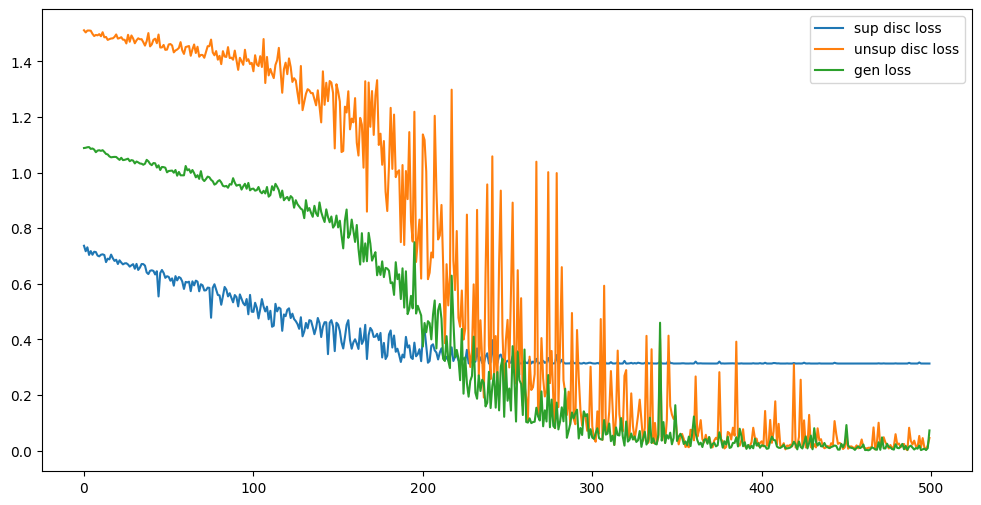

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(sup_disc_loss_values, label= "sup disc loss")
plt.plot(unsup_disc_loss_values, label= "unsup disc loss")
plt.plot(generator_loss_values, label="gen loss")
plt.legend()
plt.show()

In [ ]:
# Load model
discriminator_base = Discriminator()
discriminator_unsup = DiscriminatorUnsupervised(discriminator_base).to(device)
discriminator_sup = DiscriminatorSupervised(discriminator_base).to(device)
generator = PatchQuantumGenerator(n_generators).to(device)

generator.load_state_dict(torch.load('/content/drive/My Drive/financial_fraud/generator.pth'))
discriminator_sup.load_state_dict(torch.load('/content/drive/My Drive/financial_fraud/discriminator_sup.pth'))
discriminator_unsup.load_state_dict(torch.load('/content/drive/My Drive/financial_fraud/discriminator_unsup.pth'))

<All keys matched successfully>

In [ ]:
from sklearn.metrics import accuracy_score


accuracy = 0.0

for data, labels, cat_labels in test_loader:
    data = data.to(device)
    labels = labels.to(device)

    predictions = discriminator_sup(data)
    predicted_labels = predictions.argmax(dim=1)
    accuracy += accuracy_score(labels.cpu(), predicted_labels.cpu())

accuracy /= len(test_loader)

print(f"Accuracy on test dataset: {accuracy * 100:.2f}%")


Accuracy on test dataset: 100.00%


In [ ]:
predictions

tensor([[9.9997e-01, 3.1721e-05]], device='cuda:0', grad_fn=<SoftmaxBackward0>)

In [ ]:
predicted_labels

tensor([0], device='cuda:0')

In [ ]:
cosine_similarities = []

for i in range(10):
    generated = generator(torch.rand(1, 5, device=device) * math.pi / 2).flatten().cpu().detach().numpy()
    cosine_similarity = np.dot(generated, tsne_data[i]) / (np.linalg.norm(generated) * np.linalg.norm(tsne_data[i]))
    cosine_similarities.append(cosine_similarity)

print(np.average(cosine_similarities))

-0.048037816


In [ ]:
generated

array([3.75088006e-02, 4.51040175e-03, 4.08199653e-02, 3.50105553e-03,
       3.16302362e-03, 5.66957742e-02, 1.68019280e-01, 8.01164191e-03,
       8.92302543e-02, 4.55078862e-07, 1.00000000e+00, 1.53646410e-01,
       5.24887800e-01, 3.68555278e-01, 5.83104610e-01, 1.38026355e-02,
       8.84380788e-02, 1.01688951e-01, 3.42684723e-02, 9.79225733e-04,
       1.42512009e-01, 2.84640312e-01, 8.61707553e-02, 2.46973988e-02,
       1.03016593e-03, 1.94839895e-01, 4.88063842e-01, 1.00000000e+00,
       2.81561129e-02, 9.68051851e-02, 1.89748585e-01, 5.11577249e-01,
       2.62296293e-03, 3.02349596e-04, 1.63741529e-01, 3.38067383e-01,
       2.99286693e-01, 6.98101401e-01, 6.19018218e-03, 2.62641493e-04,
       5.70196569e-01, 9.86158609e-01, 3.06121200e-01, 1.00000000e+00,
       2.57562488e-01, 8.58823955e-01, 3.36079031e-01, 4.81491536e-01,
       2.60600820e-04, 2.21723959e-01, 6.32058876e-03, 2.00145379e-01,
       2.32926160e-01, 3.20520580e-01, 2.62726098e-01, 1.98251866e-02,
      

In [ ]:
tsne_data[i]

array([ 2.5522146e-01,  1.3747817e-01, -7.2348297e-02,  4.4715896e-01,
       -8.5928120e-02,  5.6765065e-02,  5.3315725e-02, -2.5119660e-02,
       -3.4392438e+00, -7.5523155e-03, -4.8265945e-02,  1.2847441e-01,
       -3.6813146e-01,  1.6893547e-02, -1.2000309e+00, -1.1983469e+00,
        3.1694140e-02, -1.5052011e-02,  1.9828359e+00, -2.8031347e-02,
       -1.1248804e-02,  1.5748816e-03, -6.5102959e-01,  7.5176125e-04,
       -1.1272032e+00,  1.3395518e-01,  2.7317526e-03,  7.9338001e-03,
        2.2039531e-01,  8.8994186e-03, -1.9096516e-02, -1.1322876e-02,
        3.4600109e-02,  8.5739195e-03,  1.9902216e+00, -2.9551250e-01,
        9.1956830e-01, -4.2216215e+00,  3.6230016e-02,  1.3005688e-02,
       -3.9309843e+00,  9.1221668e-02,  2.4938311e-01, -3.7218172e-02,
        6.4652167e-02, -2.1667387e+00,  1.0260398e-01, -1.0968785e+00,
        1.3620934e-02, -2.8228674e-03, -6.3908681e-02,  2.8123122e-01,
        4.4435360e-02, -4.8856247e-02, -7.2668856e-03, -2.4162352e-02,
      

In [ ]:
manhattan = lambda a,b: sum(abs(val1-val2) for val1, val2 in zip(a,b))
distances = []

for i in range(10):
    generated = generator(torch.rand(1, 64, device=device)).flatten().cpu().detach().numpy()
    distances.append(manhattan(generated, tsne_data[i]))

print(np.average(distances))

48.09229277182603


In [ ]:
distances

[61.548113256692886,
 36.10436120349914,
 40.52167372498661,
 75.39017317816615,
 40.44750242680311,
 46.974079182953574,
 46.43172816140577,
 42.884426306933165,
 45.023459607735276,
 45.59741066908464]

In [ ]:
cosine_similarities

[0.105623335,
 0.29605746,
 -0.034133747,
 -0.01818017,
 -0.05157789,
 -0.23401116,
 -0.035097033,
 0.20216903,
 -0.012645445,
 -0.2630591]

In [ ]:
# euclidean distances
manhattan = lambda a,b: sum(abs(val1-val2) for val1, val2 in zip(a,b))
euclidean = lambda a,b: np.sqrt(sum((v1-v2)**2 for v1, v2 in zip(a, b)))
euc_distances = []

for i in range(10):
    generated = generator(torch.rand(1, 64, device=device)).flatten().cpu().detach().numpy()
    euc_distances.append(euclidean(generated, tsne_data[i]))

print(np.average(euc_distances))

10.142607815934898


In [ ]:
euc_distances

[11.69483224236754,
 6.738041511114899,
 8.570100790358726,
 16.12172238308354,
 8.319424540482693,
 9.429874881612312,
 12.287826926442753,
 8.606437749073715,
 9.398842287937526,
 10.258974846875278]

In [ ]:
tsne_data.shape

(170, 64)

## Plotting

In [ ]:
sup_disc_loss_values = [i.item() for i in sup_disc_loss_values]
unsup_disc_loss_values = [i.item() for i in unsup_disc_loss_values]
generator_loss_values = [i.item() for i in generator_loss_values]

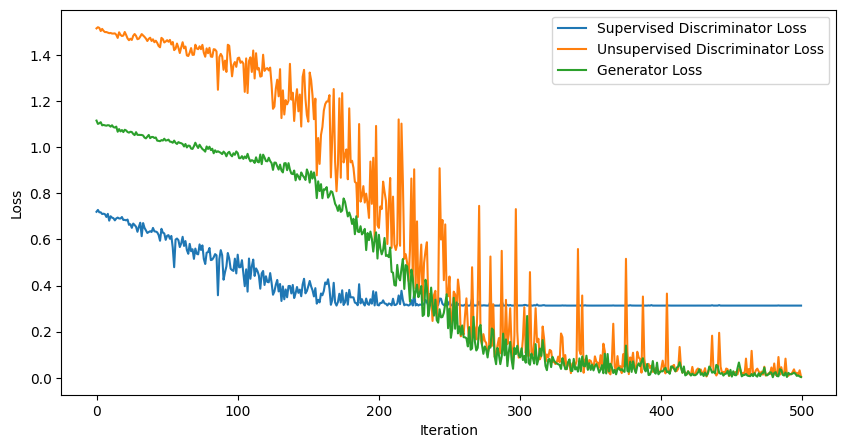

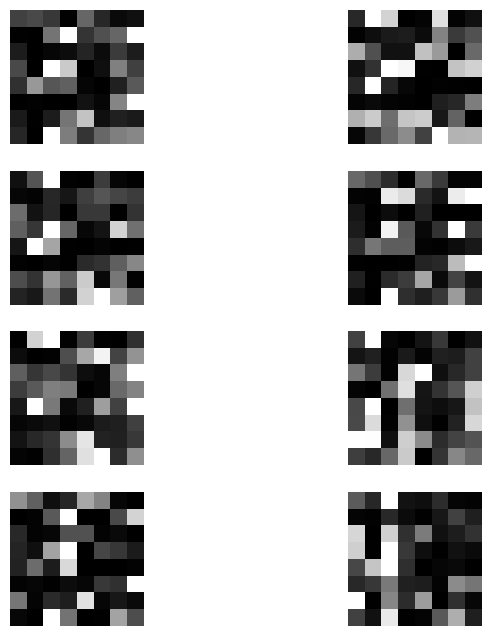

In [ ]:

plt.figure(figsize=(10, 5))
plt.plot(sup_disc_loss_values, label='Supervised Discriminator Loss')
plt.plot(unsup_disc_loss_values, label='Unsupervised Discriminator Loss')
plt.plot(generator_loss_values, label='Generator Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.legend()
plt.show()



In [ ]:
discriminator_sup(generator(torch.rand(1, 5, device=device) * math.pi / 2).reshape(1, 1, 8, 8))

tensor([[0.6649, 0.3351]], device='cuda:0', grad_fn=<SoftmaxBackward0>)

In [ ]:
discriminator_sup.eval()

DiscriminatorSupervised(
  (discriminator): Discriminator(
    (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (leaky_relu): LeakyReLU(negative_slope=0.2)
    (dropout): Dropout(p=0.2, inplace=False)
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (fc): Linear(in_features=128, out_features=2, bias=True)
  )
  (softmax): Softmax(dim=1)
)

In [ ]:
discriminator_unsup.eval()

DiscriminatorUnsupervised(
  (discriminator): Discriminator(
    (conv1): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (leaky_relu): LeakyReLU(negative_slope=0.2)
    (dropout): Dropout(p=0.2, inplace=False)
    (flatten): Flatten(start_dim=1, end_dim=-1)
    (fc): Linear(in_features=128, out_features=2, bias=True)
  )
  (custom_activation): CustomActivation()
)

In [ ]:
generator.eval()

PatchQuantumGenerator(
  (q_params): ParameterList(
      (0): Parameter containing: [torch.float32 of size 30 (cuda:0)]
      (1): Parameter containing: [torch.float32 of size 30 (cuda:0)]
      (2): Parameter containing: [torch.float32 of size 30 (cuda:0)]
      (3): Parameter containing: [torch.float32 of size 30 (cuda:0)]
  )
)

# Classical SGAN

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


class ClassicalGenerator(nn.Module):
    def __init__(self):
        super(ClassicalGenerator, self).__init__()
        self.input_dim = 64
        self.model = nn.Sequential(
            nn.ConvTranspose2d(self.input_dim, 128, kernel_size=4, stride=1, padding=0),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, 1, kernel_size=3, stride=1, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        x = x.view(x.size(0), self.input_dim, 1, 1)
        return self.model(x)


class Discriminator(nn.Module):
    def __init__(self, input_shape=(1, 8, 8), n_classes=2):
        super(Discriminator, self).__init__()

        self.conv1 = nn.Conv2d(input_shape[0], 32, kernel_size=3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1)

        self.leaky_relu = nn.LeakyReLU(0.2)
        self.dropout = nn.Dropout(0.2)
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(128 * (input_shape[1] // 8) * (input_shape[2] // 8), n_classes)

    def forward(self, x):
        x = self.leaky_relu(self.conv1(x))
        x = self.leaky_relu(self.conv2(x))
        x = self.leaky_relu(self.conv3(x))
        x = self.flatten(x)
        x = self.dropout(x)
        x = self.fc(x)
        return x

class DiscriminatorSupervised(nn.Module):
    def __init__(self, discriminator):
        super(DiscriminatorSupervised, self).__init__()
        self.discriminator = discriminator
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        x = self.discriminator(x)
        x = self.softmax(x)
        return x


class CustomActivation(nn.Module):
    def __init__(self):
        super(CustomActivation, self).__init__()

    def forward(self, x):
        Z_x = torch.sum(torch.exp(x), dim=-1, keepdim=True)
        D_x = Z_x / (Z_x + 1)
        return D_x


class DiscriminatorUnsupervised(nn.Module):
    def __init__(self, discriminator):
        super(DiscriminatorUnsupervised, self).__init__()
        self.discriminator = discriminator
        self.custom_activation = CustomActivation()

    def forward(self, x):
        x = self.discriminator(x)
        x = self.custom_activation(x)
        return x


In [ ]:
from torchsummary import summary

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = ClassicalGenerator().to(device)
discriminator = Discriminator().to(device)
disc_sup = DiscriminatorSupervised(discriminator)
disc_unsup = DiscriminatorUnsupervised(discriminator)

#print(summary(generator, (1, 8, 8)))
print(summary(disc_sup, (1, 8, 8)))
print(summary(disc_unsup, (1, 8, 8)))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1             [-1, 32, 4, 4]             320
         LeakyReLU-2             [-1, 32, 4, 4]               0
            Conv2d-3             [-1, 64, 2, 2]          18,496
         LeakyReLU-4             [-1, 64, 2, 2]               0
            Conv2d-5            [-1, 128, 1, 1]          73,856
         LeakyReLU-6            [-1, 128, 1, 1]               0
           Flatten-7                  [-1, 128]               0
           Dropout-8                  [-1, 128]               0
            Linear-9                    [-1, 2]             258
    Discriminator-10                    [-1, 2]               0
          Softmax-11                    [-1, 2]               0
Total params: 92,930
Trainable params: 92,930
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/ba

In [ ]:
generator = ClassicalGenerator().to(device)

generator(torch.randn(1, 64).to(device)).shape

torch.Size([1, 1, 8, 8])

In [ ]:
lrD = 0.01  # Learning rate for the discriminator
lrG = 0.01  # Learning rate for the generator
num_iter = 500  # Number of training iterations
batch_size = 1

In [ ]:
discriminator_base = Discriminator()
discriminator_unsup = DiscriminatorUnsupervised(discriminator_base).to(device)
discriminator_sup = DiscriminatorSupervised(discriminator_base).to(device)
generator = ClassicalGenerator().to(device)

# Binary cross entropy
criterion = nn.BCELoss()

# Categorical cross entropy
cat_criterion = nn.CrossEntropyLoss()

# Optimisers
optD1 = optim.SGD(discriminator_unsup.parameters(), lr=lrD)
optD2 = optim.SGD(discriminator_sup.parameters(), lr=lrD)
optG = optim.SGD(generator.parameters(), lr=lrG)

real_labels = torch.full((batch_size,), 1.0, dtype=torch.float, device=device)
fake_labels = torch.full((batch_size,), 0.0, dtype=torch.float, device=device)

# Iteration counter
counter = 0

# Loss values
sup_disc_loss_values = []
unsup_disc_loss_values = []
generator_loss_values = []
train_accuracies = []

results = []

while True:
    for i, (data, label, cat_label) in enumerate(train_loader):
        cat_label = cat_label.to(device)
        real_data = data.to(device)
        noise = torch.rand(batch_size, 64, device=device)
        fake_data = generator(noise)

        # Training the supervised discriminator
        discriminator_sup.zero_grad()
        outD_sup = discriminator_sup(real_data).view(-1)
        errD_sup = cat_criterion(outD_sup, cat_label.view(2))
        errD_sup.backward()
        optD2.step()

        # Training the unsupervised discriminator
        discriminator_unsup.zero_grad()
        outD_real = discriminator_unsup(real_data).view(-1)
        outD_fake = discriminator_unsup(fake_data.detach()).view(-1)
        errD_real = criterion(outD_real, real_labels)
        errD_fake = criterion(outD_fake, fake_labels)
        errD_real.backward()
        errD_fake.backward()

        errD = errD_real + errD_fake
        optD1.step()

        # Training the generator
        generator.zero_grad()
        outD_fake = discriminator_unsup(fake_data).view(-1)
        errG = criterion(outD_fake, fake_labels)
        errG.backward()
        optG.step()

        counter += 1

        sup_disc_loss_values.append(errD_sup.cpu().detach().numpy())
        unsup_disc_loss_values.append(errD.cpu().detach().numpy())
        generator_loss_values.append(errG.cpu().detach().numpy())


        if counter % 10 == 0:
            print(f'Iteration: {counter}, Supervised Discriminator Loss: {errD_sup:0.3f}, Unsupervised Discriminator Loss: {errD:0.3f}, Generator Loss: {errG:0.3f}')

        if counter == num_iter:
            break
    if counter == num_iter:
        break

Iteration: 10, Supervised Discriminator Loss: 0.666, Unsupervised Discriminator Loss: 1.467, Generator Loss: 1.027
Iteration: 20, Supervised Discriminator Loss: 0.640, Unsupervised Discriminator Loss: 1.427, Generator Loss: 0.993
Iteration: 30, Supervised Discriminator Loss: 0.637, Unsupervised Discriminator Loss: 1.386, Generator Loss: 0.950
Iteration: 40, Supervised Discriminator Loss: 0.616, Unsupervised Discriminator Loss: 1.341, Generator Loss: 0.911
Iteration: 50, Supervised Discriminator Loss: 0.584, Unsupervised Discriminator Loss: 1.310, Generator Loss: 0.835
Iteration: 60, Supervised Discriminator Loss: 0.556, Unsupervised Discriminator Loss: 1.282, Generator Loss: 0.873
Iteration: 70, Supervised Discriminator Loss: 0.553, Unsupervised Discriminator Loss: 1.204, Generator Loss: 0.712
Iteration: 80, Supervised Discriminator Loss: 0.532, Unsupervised Discriminator Loss: 1.132, Generator Loss: 0.620
Iteration: 90, Supervised Discriminator Loss: 0.425, Unsupervised Discriminator 

<function matplotlib.pyplot.show(close=None, block=None)>

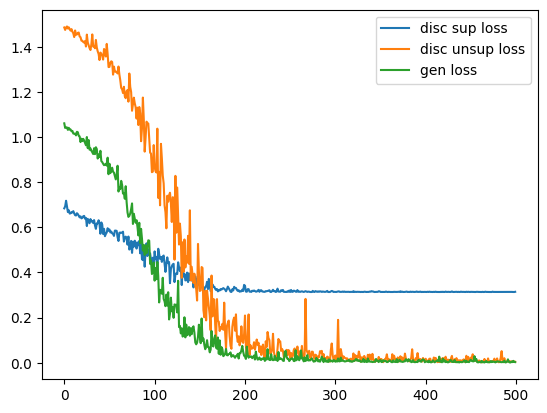

In [ ]:
# plot losses

import matplotlib.pyplot as plt

plt.plot(sup_disc_loss_values, label='disc sup loss')
plt.plot(unsup_disc_loss_values, label='disc unsup loss')
plt.plot(generator_loss_values, label='gen loss')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score


accuracy = 0.0

for data, labels, cat_labels in test_loader:
    data = data.to(device)
    labels = labels.to(device)

    predictions = discriminator_sup(data)
    predicted_labels = predictions.argmax(dim=1)
    accuracy += accuracy_score(labels.cpu(), predicted_labels.cpu())

accuracy /= len(test_loader)

print(f"Accuracy on test dataset: {accuracy * 100:.2f}%")


Accuracy on test dataset: 100.00%


In [ ]:
cosine_similarities = []

for i in range(10):
    generated = generator(torch.rand(1, 64, device=device)).flatten().cpu().detach().numpy()
    cosine_similarity = np.dot(generated, tsne_data[i]) / (np.linalg.norm(generated) * np.linalg.norm(tsne_data[i]))
    cosine_similarities.append(cosine_similarity)

print(np.average(cosine_similarities))

-0.04676817


In [ ]:
torch.save(generator.state_dict(), '/content/drive/My Drive/financial_fraud/classical_generator.pth')

In [ ]:
torch.save(discriminator_sup.state_dict(), '/content/drive/My Drive/financial_fraud/classical_discriminator_sup.pth')
torch.save(discriminator_unsup.state_dict(), '/content/drive/My Drive/financial_fraud/classical_discriminator_unsup.pth')

In [ ]:
# Load model
discriminator_base = Discriminator()
discriminator_unsup = DiscriminatorUnsupervised(discriminator_base).to(device)
discriminator_sup = DiscriminatorSupervised(discriminator_base).to(device)
generator = ClassicalGenerator().to(device)

generator.load_state_dict(torch.load('/content/drive/My Drive/financial_fraud/classical_generator.pth'))
discriminator_sup.load_state_dict(torch.load('/content/drive/My Drive/financial_fraud/classical_discriminator_sup.pth'))
discriminator_unsup.load_state_dict(torch.load('/content/drive/My Drive/financial_fraud/classical_discriminator_unsup.pth'))

<All keys matched successfully>

In [ ]:
generator(torch.rand(1, 64, device=device)).flatten().cpu().detach().numpy()

array([ 0.99392897, -0.99430674,  0.9997891 ,  0.9997525 ,  0.9988744 ,
        0.9896325 , -0.9958974 ,  0.99686474,  0.9961675 ,  0.99095243,
       -0.99971634,  0.9999582 ,  0.99410087,  0.99355257, -0.9999915 ,
       -0.96288896, -0.9993293 ,  0.99999994, -0.99993557, -0.99995005,
        0.999998  ,  0.9999943 , -0.99999964, -0.9996954 ,  0.99992603,
       -0.99924594, -0.99999905, -0.9999987 ,  0.9999865 , -0.9999685 ,
        0.9999127 , -0.99999875, -0.982993  ,  0.9999955 , -0.9999982 ,
        0.9999834 ,  0.9999992 , -0.94112545,  0.9999853 ,  0.9988061 ,
       -0.9990851 , -0.9999623 ,  0.99999934, -0.999999  ,  0.9999279 ,
       -1.        ,  0.9999966 , -0.9999427 ,  0.96958154,  0.9252654 ,
        0.99997973, -0.9991589 , -0.99999845, -0.9999902 ,  0.9999984 ,
       -0.99784034,  0.9945935 , -0.99730515,  0.99999416, -0.99998564,
        0.9999845 , -0.9997473 ,  0.99999803, -0.995691  ], dtype=float32)

In [ ]:
tsne_data[30]

array([ 2.24881843e-01,  1.03386372e-01,  1.91847101e-01, -1.66962802e+00,
       -1.64425969e-01,  6.80602565e-02, -5.43292612e-02, -3.31165403e-01,
       -1.51717293e+00, -1.24903629e-02, -4.14347276e-02, -6.55179769e-02,
        1.10354898e-02, -5.26128113e-02,  1.33575916e+00, -4.16930616e-01,
        3.63034308e-02, -1.50010325e-02,  4.38481271e-01, -9.82208271e-03,
        1.38424877e-02, -1.77968815e-02, -1.38941765e+00, -9.56065133e-02,
        7.11091608e-02,  2.47931611e-02, -1.82325544e-03,  2.25431342e-02,
       -3.18060257e-03,  1.55689009e-02, -6.11441769e-03,  1.34113254e-02,
        2.08231378e-02, -1.64564829e-02, -4.04856175e-01,  6.10644639e-01,
        2.48723507e+00,  5.98815143e-01,  2.71528035e-01,  5.04455529e-03,
        1.44435346e-01,  2.02597603e-02, -1.09722912e+00,  3.22542004e-02,
        1.87124923e-01, -1.09881961e+00,  4.06250581e-02,  1.76770902e+00,
        3.15161562e-03,  7.50248693e-03,  1.61775017e+00,  4.03398514e-01,
       -5.69169939e-01, -

In [ ]:
manhattan = lambda a,b: sum(abs(val1-val2) for val1, val2 in zip(a,b))
distances = []

for i in range(10):
    generated = generator(torch.rand(1, 64, device=device)).flatten().cpu().detach().numpy()
    distances.append(manhattan(generated, tsne_data[i]))

print(np.average(distances))

78.8777359187603


In [ ]:
distances

[82.49614733457565,
 71.74673372507095,
 83.51663255691528,
 89.00018280744553,
 70.43937009572983,
 74.26244193315506,
 83.06703633069992,
 74.6225306391716,
 84.03278422355652,
 75.59349954128265]

In [ ]:
discriminator_sup(generator(torch.rand(1, 64, device=device)))

tensor([[0.6854, 0.3146]], device='cuda:0', grad_fn=<SoftmaxBackward0>)

In [ ]:
euclidean = lambda a,b: np.sqrt(sum((v1-v2)**2 for v1, v2 in zip(a, b)))
euc_distances = []

for i in range(10):
    generated = generator(torch.rand(1, 64, device=device)).flatten().cpu().detach().numpy()
    euc_distances.append(euclidean(generated, tsne_data[i]))

print(np.average(euc_distances))

12.448423581634852


In [ ]:
euc_distances

[13.51093090977905,
 10.489548564787306,
 12.458462344037594,
 16.617143144060027,
 10.390941211506878,
 11.107774155330976,
 13.522419988099573,
 11.654846661061024,
 13.323409005736558,
 11.408759831949524]

# Visual Differences

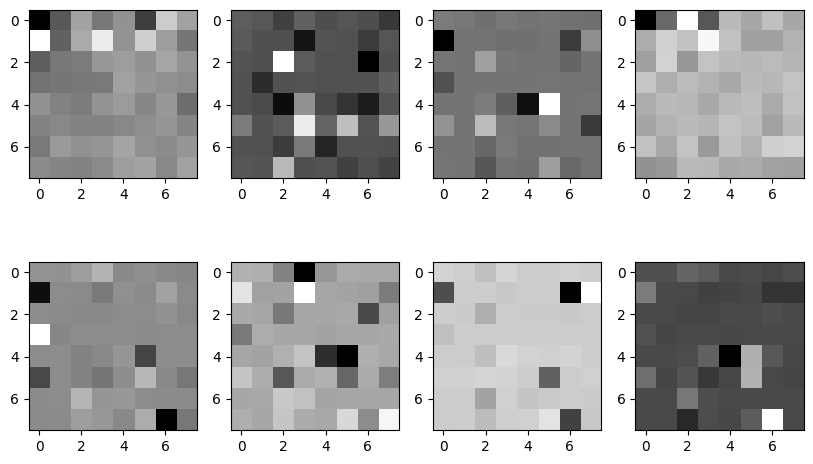

In [ ]:
plt.figure(figsize=(10, 6))

for i in range(8):
    plt.subplot(2, 4, i+1)
    plt.imshow(tsne_data[i].reshape(8, 8), cmap='gray')

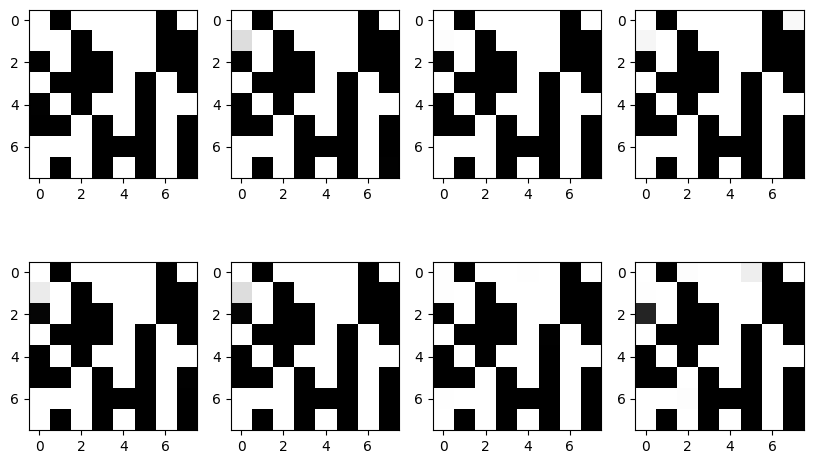

In [ ]:
# CLASSICAL
plt.figure(figsize=(10, 6))

for i in range(8):
    plt.subplot(2, 4, i+1)
    plt.imshow(generator(torch.rand(1, 64, device=device)).flatten().cpu().detach().numpy().reshape(8,8), cmap='gray')


In [ ]:
generator = PatchQuantumGenerator(n_generators).to(device)

generator.load_state_dict(torch.load('/content/drive/My Drive/financial_fraud/generator.pth'))


<All keys matched successfully>

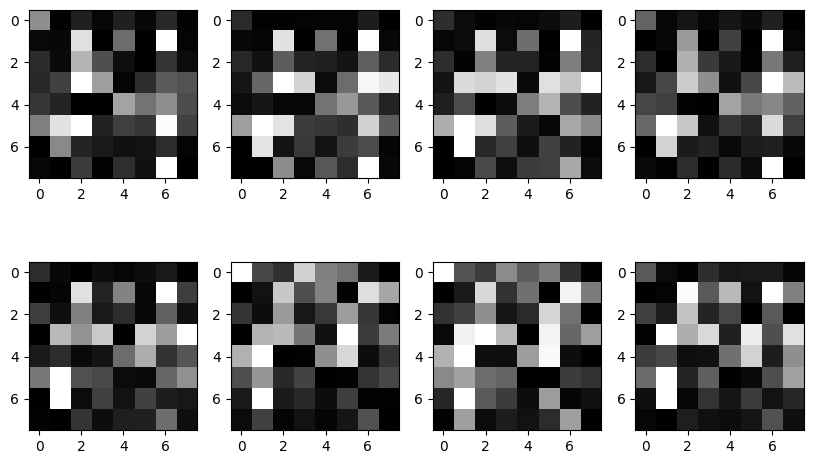

In [ ]:
# QUANTUM
plt.figure(figsize=(10, 6))

for i in range(8):
    plt.subplot(2, 4, i+1)
    plt.imshow(generator(torch.rand(1, 64, device=device)).flatten().cpu().detach().numpy().reshape(8, 8), cmap='gray')
